In [271]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from torch.autograd import Variable
import matplotlib.pyplot as plt
import interpolation as itp
from ipywidgets import interactive, interact, fixed
import ipywidgets as widgets
import pandas as pd
from scipy.stats import norm

In [132]:
class Generator(nn.Module):
    def __init__(self, z_dim=100, d=64):
        super(Generator, self).__init__()
        #1x1
        self.deconv1 = nn.ConvTranspose2d(z_dim, d*16, 4, 1, 0)
        self.deconv1_bn = nn.BatchNorm2d(d*16)
        #4x4
        self.deconv2 = nn.ConvTranspose2d(d*16, d*8, 4, 2, 1)
        self.deconv2_bn = nn.BatchNorm2d(d*8)
        #8x8
        self.deconv3 = nn.ConvTranspose2d(d*8, d*4, 4, 2, 1)
        self.deconv3_bn = nn.BatchNorm2d(d*4)
        #16x16
        self.deconv4 = nn.ConvTranspose2d(d*4, d*2, 4, 2, 1)
        self.deconv4_bn = nn.BatchNorm2d(d*2)
        #32x32
        self.deconv5 = nn.ConvTranspose2d(d*2, d, 4, 2, 1)
        self.deconv5_bn = nn.BatchNorm2d(d) 
        #64x64
        self.deconv6 = nn.ConvTranspose2d(d, 3, 4, 2, 1)
        #128x128
        
    def forward(self, x):
        x = F.relu(self.deconv1_bn(self.deconv1(x)))
        x = F.relu(self.deconv2_bn(self.deconv2(x)))
        x = F.relu(self.deconv3_bn(self.deconv3(x)))
        x = F.relu(self.deconv4_bn(self.deconv4(x)))
        x = F.relu(self.deconv5_bn(self.deconv5(x)))
        return F.tanh(self.deconv6(x))

In [133]:
G = Generator()
G.load_state_dict(torch.load('generator_param.pkl', map_location=lambda storage, loc: storage))
G.eval()

Generator(
  (deconv1): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1))
  (deconv1_bn): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True)
  (deconv2): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (deconv2_bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True)
  (deconv3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (deconv3_bn): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True)
  (deconv4): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (deconv4_bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True)
  (deconv5): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (deconv5_bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
  (deconv6): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
)

In [246]:
#Batch size 100-200
#Calculate means of each channel and the global mean  

def show_result(G, z):
#     z = Variable(z, volatile=True)
    samples = G(z).data.numpy()
    samples = samples.transpose(0, 2, 3, 1)
    samples = (samples + 1) / 2
    
    dark_mean = np.mean(samples,axis=(1,2,3))
    red_mean = np.mean(samples[:,:,:,0],axis=(1,2))
    green_mean = np.mean(samples[:,:,:,1],axis=(1,2))
    blue_mean = np.mean(samples[:,:,:,2],axis=(1,2))
    
    image_per_line = 10
    
    n_samples = samples.shape[0]
    n_columns = min(n_samples, image_per_line)
    n_rows = 1 + n_samples//n_columns - (n_samples%n_columns==0)
    
    if n_samples == 1:
        plt.imshow(samples[0])
        return 
    
    fig, ax = plt.subplots(n_rows, n_columns, figsize=(18, n_rows*2))
    if n_samples<=n_columns:
        for j in range(n_columns):
            ax[j].get_xaxis().set_visible(False)
            ax[j].get_yaxis().set_visible(False)
            ax[j].cla()
            ax[j].imshow(samples[j])
    else:
        for i in range(n_rows):
            for j in range(n_columns):
                ax[i, j].get_xaxis().set_visible(False)
                ax[i, j].get_yaxis().set_visible(False)
                ax[i, j].cla()
                k = i*image_per_line+j
                ax[i, j].imshow(samples[k])
                ax[i, j].set_title('d={:2.2f}, r={:2.2f}, \n g={:2.2f}, b={:2.2f}'.format(dark_mean[k], red_mean[k], green_mean[k], blue_mean[k]))
    plt.tight_layout(h_pad=1.2)
    plt.show()

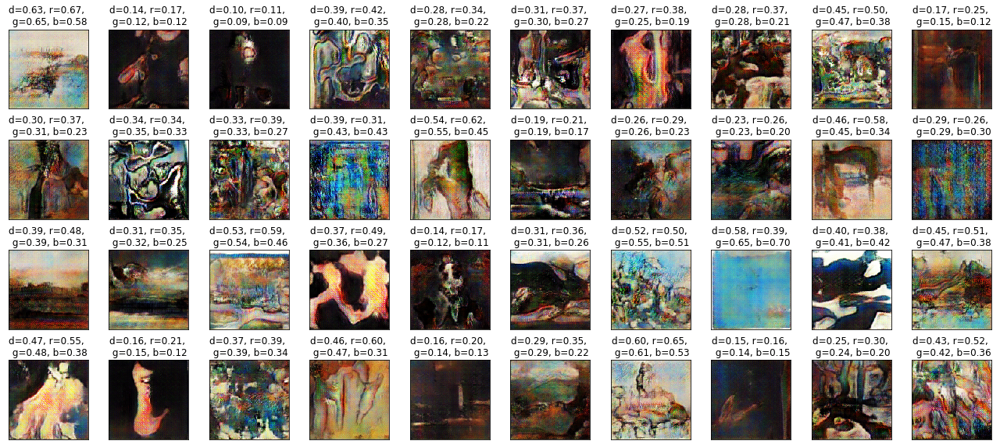

In [137]:
z = torch.FloatTensor(40, 100, 1, 1).normal_()
show_result(G, z)

In [7]:
def show_interpolation(G, z1, z2, n, mode = 'lerp'):
    z1 = z1.view(1,-1,1,1)
    z2 = z2.view(1,-1,1,1)
    vals = np.linspace(0, 1, n)
    z = torch.Tensor([])
    for v in vals:
        if mode == 'lerp':
            res = itp.lerp(v, z1, z2)
        else:
            z1n = z1.numpy().reshape(-1)
            z2n = z2.numpy().reshape(-1)
            res = itp.slerp(v, z1n, z2n)
            res = torch.Tensor(res).view(1,-1,1,1)
            
        z = torch.cat([z, res],0)
#     print(torch.eq(z[0],z1), torch.eq(z[-1],z2))
    show_result(G, z)

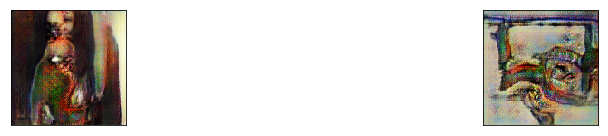

In [8]:
def make_z(batch, latentsize):
    return torch.FloatTensor(batch,latentsize,1,1).normal_()

z_ = torch.FloatTensor(2, 100, 1, 1).normal_()
show_result(G,z_)

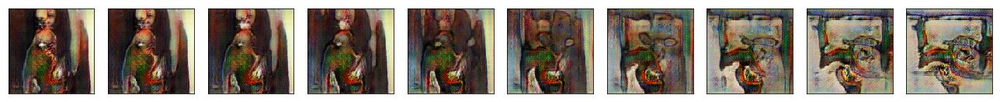

In [9]:
show_interpolation(G, z_[0], z_[1], 10, 'slerp')

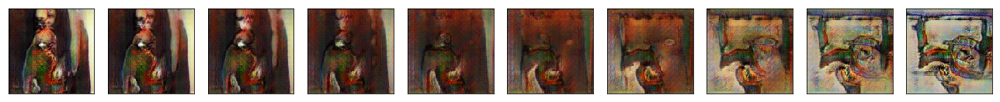

In [10]:
show_interpolation(G, z_[0], z_[1], 10, 'lerp')

In [16]:
z1 = z_[0].numpy().reshape(-1)
z2 = z_[1].numpy().reshape(-1)
d = z1 - z2
d2 = z_[0].numpy().reshape(-1) + d

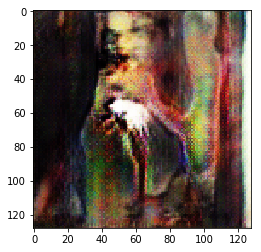

In [17]:
show_result(G,torch.from_numpy(d.reshape(1,100,1,1)))

In [18]:
idx = np.argsort(abs(d))
idx

array([95, 90, 86, 72, 42, 45, 24, 26, 23, 74, 80, 51, 71, 66, 46,  0, 29,
        6, 60, 69, 63, 11, 99, 48,  7,  5, 32, 61, 84, 19, 49, 40, 67, 98,
       18, 13, 94, 85, 57,  4, 91,  1, 82, 77, 83,  2, 28, 64, 50, 21, 20,
       41, 93, 81, 17, 10, 68, 27, 73, 59, 36,  8, 62, 96, 79, 76, 22, 31,
       35, 43, 54, 12, 89, 34, 33, 75, 65, 58, 92, 30, 38, 97, 16, 15, 55,
       14, 53, 70, 25,  9, 78, 39, 87, 52, 37, 56, 47, 44,  3, 88])

In [19]:
d[idx]

array([-0.00390542, -0.01925886,  0.02088979, -0.06797278, -0.08258516,
        0.11263838,  0.11850195,  0.14654988,  0.16407478, -0.17370814,
       -0.22324407,  0.24155003, -0.2420882 , -0.2504962 ,  0.255896  ,
       -0.271421  , -0.29396158,  0.29756844,  0.31176847, -0.3593027 ,
       -0.3657933 ,  0.43675596,  0.4462962 ,  0.46713555, -0.47534132,
        0.4768797 ,  0.5006437 , -0.5091405 , -0.5148823 , -0.5227556 ,
       -0.52940047, -0.5363013 , -0.606853  , -0.62651545,  0.6435795 ,
       -0.65706843,  0.6613966 ,  0.6955406 , -0.6983658 , -0.74570036,
        0.74984926, -0.75189644,  0.755129  , -0.8483402 ,  0.852873  ,
       -0.85310125,  0.85990626, -0.88112044,  0.8841486 , -0.8895241 ,
       -0.8918773 ,  0.9386149 ,  0.94611305, -0.9531514 , -1.0029849 ,
        1.1272724 ,  1.1600266 , -1.1874139 , -1.191584  ,  1.1998292 ,
        1.2051183 , -1.2166345 ,  1.2295609 ,  1.2474144 ,  1.2868608 ,
       -1.370431  , -1.3837056 , -1.4064512 , -1.417968  ,  1.45

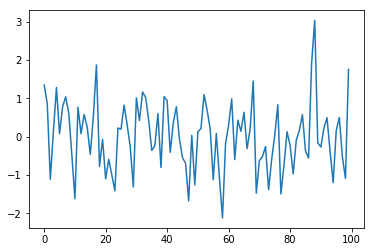

In [20]:
plt.plot(z[0].numpy().reshape(-1))

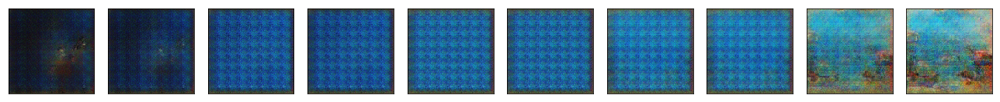

In [21]:
#check for other dimensions (for loop)
#substract to get differences; add to other samples?
p = torch.FloatTensor([-5] + 99*[0]).view(-1,1,1)
q = torch.FloatTensor([5] + 99*[0]).view(-1,1,1)
show_interpolation(G, p,q,10,'slerp')

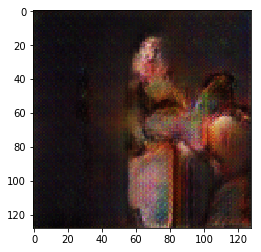

In [22]:
p = torch.FloatTensor([-10] + 99*[0]).view(1,-1,1,1)
show_result(G,p)

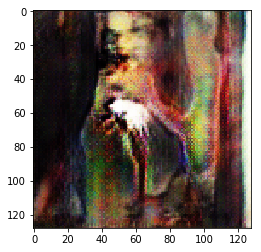

In [23]:
d_tensor = torch.Tensor(d).view(1,-1,1,1)
show_result(G,d_tensor)

In [24]:
def interact_z(dims, z=None, latent_size=100, G=G):
    """
    Displays interactive plot showing the effect of z on the output.
    dims is a list containing the dimensions you want to play with (index starts at 0)
    You can pass a z and, if you don't, one of size latent_size will be sampled at random.
    """
    if z is None:
        z = make_z(1, latent_size)
    
    args = {'z':fixed(z)}
    for d in dims:
        args[str(d)] = widgets.FloatSlider(value=0, min=-5, max=5, step=0.1)
        
    def show_interact(**args):
        print('here')
        for d, zd in args.items():
            if d != 'z':
                z[0,int(d),0,0] = zd
            
        show_result(G,z)
        
    interact(show_interact, **args)

In [25]:
interact_z(range(100),make_z(1,100))

interactive(children=(FloatSlider(value=0.0, description='0', max=5.0, min=-5.0), FloatSlider(value=0.0, description='1', max=5.0, min=-5.0), FloatSlider(value=0.0, description='2', max=5.0, min=-5.0), FloatSlider(value=0.0, description='3', max=5.0, min=-5.0), FloatSlider(value=0.0, description='4', max=5.0, min=-5.0), FloatSlider(value=0.0, description='5', max=5.0, min=-5.0), FloatSlider(value=0.0, description='6', max=5.0, min=-5.0), FloatSlider(value=0.0, description='7', max=5.0, min=-5.0), FloatSlider(value=0.0, description='8', max=5.0, min=-5.0), FloatSlider(value=0.0, description='9', max=5.0, min=-5.0), FloatSlider(value=0.0, description='10', max=5.0, min=-5.0), FloatSlider(value=0.0, description='11', max=5.0, min=-5.0), FloatSlider(value=0.0, description='12', max=5.0, min=-5.0), FloatSlider(value=0.0, description='13', max=5.0, min=-5.0), FloatSlider(value=0.0, description='14', max=5.0, min=-5.0), FloatSlider(value=0.0, description='15', max=5.0, min=-5.0), FloatSlider(value=0.0, description='16', max=5.0, min=-5.0), FloatSlider(value=0.0, description='17', max=5.0, min=-5.0), FloatSlider(value=0.0, description='18', max=5.0, min=-5.0), FloatSlider(value=0.0, description='19', max=5.0, min=-5.0), FloatSlider(value=0.0, description='20', max=5.0, min=-5.0), FloatSlider(value=0.0, description='21', max=5.0, min=-5.0), FloatSlider(value=0.0, description='22', max=5.0, min=-5.0), FloatSlider(value=0.0, description='23', max=5.0, min=-5.0), FloatSlider(value=0.0, description='24', max=5.0, min=-5.0), FloatSlider(value=0.0, description='25', max=5.0, min=-5.0), FloatSlider(value=0.0, description='26', max=5.0, min=-5.0), FloatSlider(value=0.0, description='27', max=5.0, min=-5.0), FloatSlider(value=0.0, description='28', max=5.0, min=-5.0), FloatSlider(value=0.0, description='29', max=5.0, min=-5.0), FloatSlider(value=0.0, description='30', max=5.0, min=-5.0), FloatSlider(value=0.0, description='31', max=5.0, min=-5.0), FloatSlider(value=0.0, description='32', max=5.0, min=-5.0), FloatSlider(value=0.0, description='33', max=5.0, min=-5.0), FloatSlider(value=0.0, description='34', max=5.0, min=-5.0), FloatSlider(value=0.0, description='35', max=5.0, min=-5.0), FloatSlider(value=0.0, description='36', max=5.0, min=-5.0), FloatSlider(value=0.0, description='37', max=5.0, min=-5.0), FloatSlider(value=0.0, description='38', max=5.0, min=-5.0), FloatSlider(value=0.0, description='39', max=5.0, min=-5.0), FloatSlider(value=0.0, description='40', max=5.0, min=-5.0), FloatSlider(value=0.0, description='41', max=5.0, min=-5.0), FloatSlider(value=0.0, description='42', max=5.0, min=-5.0), FloatSlider(value=0.0, description='43', max=5.0, min=-5.0), FloatSlider(value=0.0, description='44', max=5.0, min=-5.0), FloatSlider(value=0.0, description='45', max=5.0, min=-5.0), FloatSlider(value=0.0, description='46', max=5.0, min=-5.0), FloatSlider(value=0.0, description='47', max=5.0, min=-5.0), FloatSlider(value=0.0, description='48', max=5.0, min=-5.0), FloatSlider(value=0.0, description='49', max=5.0, min=-5.0), FloatSlider(value=0.0, description='50', max=5.0, min=-5.0), FloatSlider(value=0.0, description='51', max=5.0, min=-5.0), FloatSlider(value=0.0, description='52', max=5.0, min=-5.0), FloatSlider(value=0.0, description='53', max=5.0, min=-5.0), FloatSlider(value=0.0, description='54', max=5.0, min=-5.0), FloatSlider(value=0.0, description='55', max=5.0, min=-5.0), FloatSlider(value=0.0, description='56', max=5.0, min=-5.0), FloatSlider(value=0.0, description='57', max=5.0, min=-5.0), FloatSlider(value=0.0, description='58', max=5.0, min=-5.0), FloatSlider(value=0.0, description='59', max=5.0, min=-5.0), FloatSlider(value=0.0, description='60', max=5.0, min=-5.0), FloatSlider(value=0.0, description='61', max=5.0, min=-5.0), FloatSlider(value=0.0, description='62', max=5.0, min=-5.0), FloatSlider(value=0.0, description='63', max=5.0, min=-5.0), FloatSlider(value=0.0, description='64', max=5.0, min=-5.0), FloatSlider(value=0.0, 

# Second DCGAN model (more complete?)

In [26]:
class G2enerator(nn.Module):
    def __init__(self, zdim=100, n_feature_maps=128):
        super(G2enerator, self).__init__()
        self.main = nn.Sequential(
            #1x1
            nn.ConvTranspose2d(zdim, 8*n_feature_maps, 4, 1, 0, bias=False),
            nn.BatchNorm2d(8*n_feature_maps),
            nn.ReLU(True),
            #4x4
            nn.ConvTranspose2d(8*n_feature_maps, 4*n_feature_maps, 4, 2, 1, bias=False),
            nn.BatchNorm2d(4*n_feature_maps),
            nn.ReLU(True),
            #8x8
            nn.ConvTranspose2d(4*n_feature_maps, 2*n_feature_maps, 4, 2, 1, bias=False),
            nn.BatchNorm2d(2*n_feature_maps),
            nn.ReLU(True),
            #16x16
            nn.ConvTranspose2d(2*n_feature_maps, n_feature_maps, 4, 2, 1, bias=False),
            nn.BatchNorm2d(n_feature_maps),
            nn.ReLU(True),
            #32x32
            nn.ConvTranspose2d(n_feature_maps, 3, 4, 2, 1, bias=False),
            #64x64
            nn.Tanh()
        )

    def  forward(self, x):
        return self.main(x)

In [27]:
G2 = G2enerator()
G2.load_state_dict(torch.load('paintings64_DCGAN_128_generator', map_location=lambda storage, loc: storage))
G2.eval()

G2enerator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

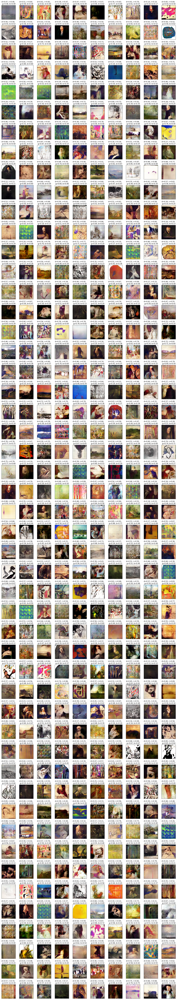

In [139]:
z = torch.FloatTensor(500, 100, 1, 1).normal_()
show_result(G2, z)

# ACGAN portraits

In [29]:
class ACGenerator(nn.Module):
    def __init__(self, zdim=100, n_feature_maps=128):
        super(ACGenerator, self).__init__()
        self.main = nn.Sequential(
            #1x1
            nn.ConvTranspose2d(zdim+21, 8*n_feature_maps, 4, 1, 0, bias=False),
            nn.BatchNorm2d(8*n_feature_maps),
            nn.ReLU(True),
            #4x4
            nn.ConvTranspose2d(8*n_feature_maps, 4*n_feature_maps, 4, 2, 1, bias=False),
            nn.BatchNorm2d(4*n_feature_maps),
            nn.ReLU(True),
            #8x8
            nn.ConvTranspose2d(4*n_feature_maps, 2*n_feature_maps, 4, 2, 1, bias=False),
            nn.BatchNorm2d(2*n_feature_maps),
            nn.ReLU(True),
            #16x16
            nn.ConvTranspose2d(2*n_feature_maps, n_feature_maps, 4, 2, 1, bias=False),
            nn.BatchNorm2d(n_feature_maps),
            nn.ReLU(True),
            #32x32
            nn.ConvTranspose2d(n_feature_maps, 3, 4, 2, 1, bias=False),
            #64x64
            nn.Tanh()
        )

    def  forward(self, x):
        return self.main(x)

In [30]:
ACG = ACGenerator()
ACG.load_state_dict(torch.load('portraits64_ACGAN_generator.dms', map_location=lambda storage, loc: storage))
ACG.eval()

ACGenerator(
  (main): Sequential(
    (0): ConvTranspose2d(121, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

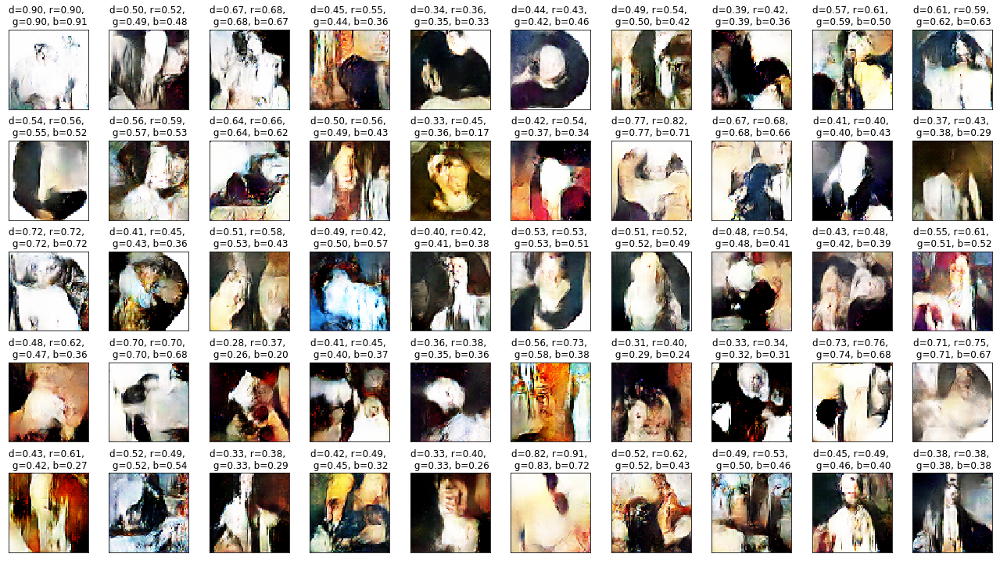

In [31]:
z = torch.FloatTensor(50, 121, 1, 1).normal_()
show_result(ACG, z)

In [32]:
interact_z([1,5,10,15,20,25], latent_size=121, G=ACG)

interactive(children=(FloatSlider(value=0.0, description='1', max=5.0, min=-5.0), FloatSlider(value=0.0, description='5', max=5.0, min=-5.0), FloatSlider(value=0.0, description='10', max=5.0, min=-5.0), FloatSlider(value=0.0, description='15', max=5.0, min=-5.0), FloatSlider(value=0.0, description='20', max=5.0, min=-5.0), FloatSlider(value=0.0, description='25', max=5.0, min=-5.0), Output()), _dom_classes=('widget-interact',))

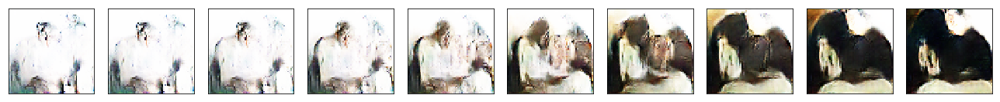

In [36]:
show_interpolation(ACG, z[0], z[4], 10, 'slerp')

In [37]:
z1 = z[25].numpy().reshape(-1)
z2 = z[39].numpy().reshape(-1)
d = z1 - z2
d2 = z[44].numpy().reshape(-1) + d

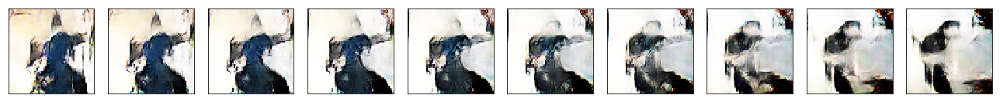

In [38]:
show_interpolation(ACG, z[17], z[31], 10, 'slerp')

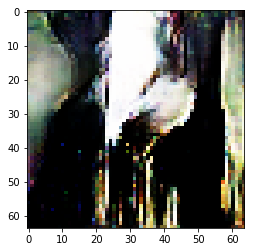

In [39]:
show_result(ACG,torch.from_numpy(d.reshape(1,121,1,1)))

# InfoGan

In [127]:
class Generator64(nn.Module):
    def __init__(self, latent_dim, n_feature_maps, n_channels):
        super(Generator64, self).__init__()
        self.main = nn.Sequential(
            #1x1
            nn.ConvTranspose2d(latent_dim, 8*n_feature_maps, 4, 1, 0, bias=False),
            nn.BatchNorm2d(8*n_feature_maps),
            nn.ReLU(True),
            #4x4
            nn.ConvTranspose2d(8*n_feature_maps, 4*n_feature_maps, 4, 2, 1, bias=False),
            nn.BatchNorm2d(4*n_feature_maps),
            nn.ReLU(True),
            #8x8
            nn.ConvTranspose2d(4*n_feature_maps, 2*n_feature_maps, 4, 2, 1, bias=False),
            nn.BatchNorm2d(2*n_feature_maps),
            nn.ReLU(True),
            #16x16
            nn.ConvTranspose2d(2*n_feature_maps, n_feature_maps, 4, 2, 1, bias=False),
            nn.BatchNorm2d(n_feature_maps),
            nn.ReLU(True),
            #32x32
            nn.ConvTranspose2d(n_feature_maps, n_channels, 4, 2, 1, bias=False),
            #64x64
            nn.Tanh()
        )
        
    def  forward(self, z):
        return self.main(z)

In [128]:
infoG = Generator64(latent_dim=100, n_feature_maps=128, n_channels=3)
infoG.load_state_dict(torch.load('paintings64_InfoGAN2_128_generator', map_location=lambda storage, loc: storage))
infoG.eval()

Generator64(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [178]:
z = torch.FloatTensor(50, 100, 1, 1).normal_()
show_result(G2, z)

TypeError: argument 0 is not a Variable

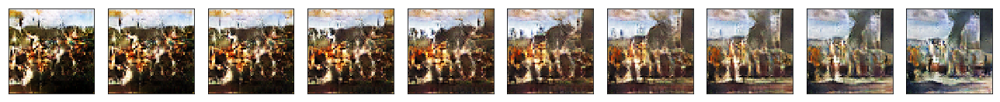

In [44]:
show_interpolation(infoG, z[3], z[29], 10, 'slerp')

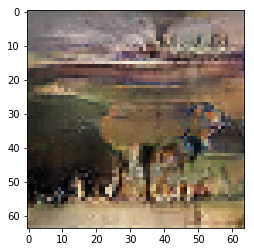

In [36]:
show_result(infoG,z[1].view(1,-1,1,1))

# Create images of certain colour category

In [45]:
def find_zs(G, z):
    #sample z
    z = Variable(z, volatile=True)
    #compute G(z)
    samples = G(z).data.numpy()
    samples = samples.transpose(0, 2, 3, 1)
    samples = (samples + 1) / 2
    d = {}
    for i,s in enumerate(samples):
        c = classify(s)
        d[i] = (c,z)
        
    df = pd.Dataframe(d)
    #maybe transpose
    #df = df.transpose()
    df = df[df.category!="no_category"]
    
    dark_mean_z = df[df.category =="dark"].mean (axis = d)
    return df

In [140]:
def classify(s):
    
    
    d = np.mean(s,axis=(0,1,2))
    r = np.mean(s[:,:,0], axis=(0,1))
    g = np.mean(s[:,:,1], axis=(0,1))
    b = np.mean(s[:,:,2], axis=(0,1))

    diff_r_d = r-d
    diff_g_r = g-r
    diff_b_g = b-g

    if d <= 0.15:
        category = 'Dark'
    elif d >= 0.8:
        category = 'Light'
    elif diff_r_d > 0.1 and diff_r_d < 0.25 and \
         diff_g_r > -0.35 and diff_g_r < -0.2 and \
         diff_b_g > -0.05 and diff_b_g < 0.05:
        category = 'Red'
    elif diff_r_d > -0.35 and diff_r_d < -0.05 and \
         diff_g_r > 0.10 and diff_g_r < 0.4 and \
         diff_b_g > 0.05 and diff_b_g < 0.15:
        category = 'Blue'
    else:
        category = 'Other'
    return category

In [141]:
def show_category(G, z):
    z = Variable(z, volatile=True)
    samples = G(z).data.numpy()
    samples = samples.transpose(0, 2, 3, 1)
    samples = (samples + 1) / 2
    
    # Sample channel means
    dark_mean = np.mean(samples,axis=(1,2,3))
    red_mean = np.mean(samples[:,:,:,0],axis=(1,2))
    green_mean = np.mean(samples[:,:,:,1],axis=(1,2))
    blue_mean = np.mean(samples[:,:,:,2],axis=(1,2))
    
    D = {} 
    
    for i,s in enumerate(samples):
        category = classify(s)
        D[i] = category
        
    C = {}
    for v in D.values():
        if not v in C: 
            C[v] = 1
        else:
            C[v] += 1
     
    C_pd = pd.DataFrame.from_dict(C, orient='index')
    C_pd.columns = ['Category count']
        
    image_per_line = 4
    
    idx_colour = [k for k,v in D.items() if v != 'Other']
    print(idx_colour)
    samples = samples[idx_colour]
    
    n_samples = samples.shape[0]
    n_columns = min(n_samples, image_per_line)
    n_rows = 1 + n_samples//n_columns - (n_samples%n_columns==0)
    
    if n_samples == 1:
        plt.imshow(samples[0])
        return 
    
    fig, ax = plt.subplots(n_rows, n_columns, figsize=(18, n_rows*2))
    if n_samples<=n_columns:
        for j in range(n_columns):
            ax[j].get_xaxis().set_visible(False)
            ax[j].get_yaxis().set_visible(False)
            ax[j].cla()
            ax[j].imshow(samples[j])
            ax[j].set_title(str(idx_colour[j]) + ' ' + D[idx_colour[j]])
    else:
        for i in range(n_rows):
            for j in range(n_columns):
                ax[i, j].get_xaxis().set_visible(False)
                ax[i, j].get_yaxis().set_visible(False)
                ax[i, j].cla()
                k = i*image_per_line+j
                if k<n_samples: 
                    ax[i, j].imshow(samples[k])
                    ax[i, j].set_title(str(idx_colour[k])+ ' ' + D[idx_colour[k]])
    plt.tight_layout(h_pad=1.2)
    plt.show()
    return C_pd, idx_colour

[15, 28, 34, 50, 82, 88]


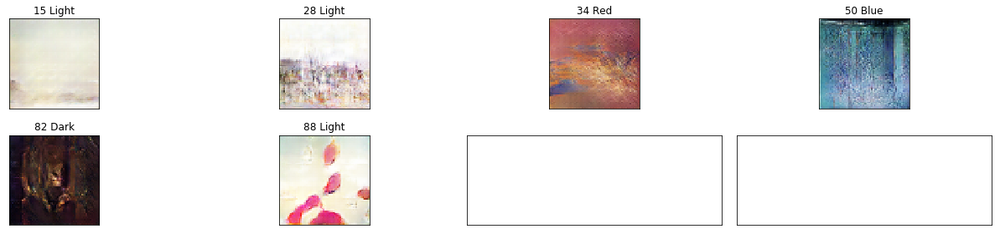

(       Category count
 Other              94
 Light               3
 Red                 1
 Blue                1
 Dark                1, [15, 28, 34, 50, 82, 88])

In [145]:
z = torch.FloatTensor(100, 100, 1, 1).normal_()
show_category(G2, z)

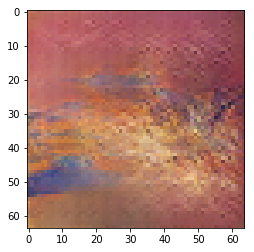

In [146]:
z_red = z[34].view(1,-1,1,1)
z_blue = z[50].view(1,-1,1,1)
z_redandblue = z_red + z_blue 
show_result(G2,z_red)

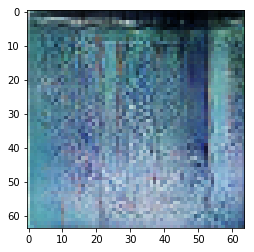

In [147]:
show_result(G2,z_blue)

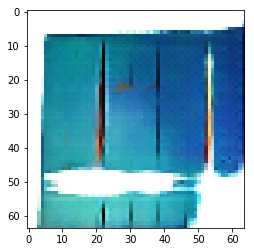

In [148]:
show_result(G2,z_redandblue)#torch.from_numpy(z_red.reshape(1,100,1,1)))

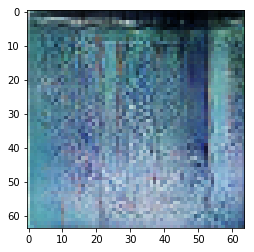

In [149]:
z_dark = z[2].view(1,-1,1,1)
z_try = z_dark - z_dark + z_blue
show_result(G2,z_try)

In [152]:
blue_1 = (z[50].view(1,-1,1,1)).numpy().reshape(-1)
blue_2 = (z[50].view(1,-1,1,1)).numpy().reshape(-1)
blue_3 = (z[50].view(1,-1,1,1)).numpy().reshape(-1)
blue_4 = (z[50].view(1,-1,1,1)).numpy().reshape(-1)
mean_blue = (blue_1 + blue_2 + blue_3 + blue_4)/4
mean_blue

array([ 0.7606991 ,  1.3364445 ,  2.0126388 , -0.3046879 ,  0.80009454,
        0.19187064,  0.35218704,  0.49812248,  0.5643379 , -0.66261244,
       -0.91360426,  2.7205145 , -0.47030726,  0.38734552, -0.5371001 ,
        0.13794696, -4.0667543 , -1.1617856 ,  1.7701721 , -1.9501581 ,
        1.085058  ,  0.21003744,  0.15715069,  0.30161765,  0.46752137,
       -0.37449044,  0.52822405, -0.6750742 , -1.0942029 , -1.6290668 ,
        1.5301716 ,  1.1040905 , -0.43922454,  0.21532315, -0.20288217,
        2.0862672 , -0.11437667,  0.635172  , -2.1668003 , -1.0031433 ,
       -0.10634217, -0.51308036, -0.69550246,  1.7864733 , -0.57174957,
       -0.20764215,  1.3317448 , -1.087631  , -0.5106841 ,  0.7972132 ,
        0.24093983, -0.61461323, -0.41954118, -1.6197342 ,  0.43051368,
       -0.8080937 , -0.80511314,  0.03537048, -0.02194502, -1.6835862 ,
        0.8144696 , -0.63161683, -1.0762147 , -0.21211272, -0.5519799 ,
        1.0602343 , -1.362185  , -0.5797551 ,  0.06432298, -0.83

[3, 4, 7, 8, 12, 17, 25, 26, 28, 31, 32, 33, 38, 40, 41, 46, 47, 51, 54, 55, 58, 59, 60, 62, 66, 73, 74, 75, 77, 89, 95, 96, 99, 100, 105, 109, 110, 113, 115, 116, 119, 120, 122, 129, 140, 143, 144, 146, 153, 156, 157, 163, 164, 165, 176, 180, 183, 186, 192, 193, 194, 195]


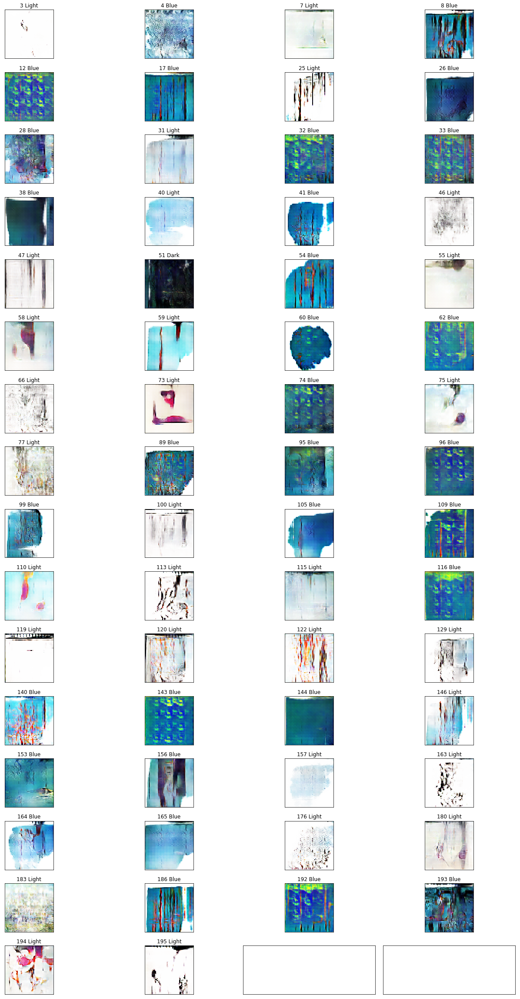

(       Category count
 Other             138
 Light              30
 Blue               31
 Dark                1,
 [3,
  4,
  7,
  8,
  12,
  17,
  25,
  26,
  28,
  31,
  32,
  33,
  38,
  40,
  41,
  46,
  47,
  51,
  54,
  55,
  58,
  59,
  60,
  62,
  66,
  73,
  74,
  75,
  77,
  89,
  95,
  96,
  99,
  100,
  105,
  109,
  110,
  113,
  115,
  116,
  119,
  120,
  122,
  129,
  140,
  143,
  144,
  146,
  153,
  156,
  157,
  163,
  164,
  165,
  176,
  180,
  183,
  186,
  192,
  193,
  194,
  195])

In [153]:
z_b = torch.FloatTensor(200, 100, 1, 1).normal_() + torch.Tensor(mean_blue).view(1,-1,1,1)
show_category(G2, z_b)

In [154]:
mean_blue = (z[13] + z[70] + z[117] + z[49]) / 4
mean_blue.squeeze()

IndexError: index 117 is out of range for dimension 0 (of size 100)

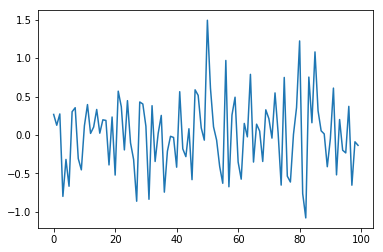

In [191]:
plt.plot(mean_blue.numpy().flatten())

In [ ]:
def create_blue:
    z = torch.FloatTensor(500, 100, 1, 1).normal_()
    show_category(G2, z)
    

# Colour control

In [155]:
# for loop, generate images and put all the colour images in a seperate list until 
# you have enough samples (50 blue, 10 for red)
# dict = key: "colour, value: [z1, z2, z3]

# Goal: Generate images of certain colour
# sample z's of each colour
# calculate mean of each colour
# calculate new global colour mean to get colour vector
# add this vector to random new samples
# see what it looks like

def show_category_colour(G, z):
    z = Variable(z, volatile=True)
    samples = G(z).data.numpy()
    samples = samples.transpose(0, 2, 3, 1)
    samples = (samples + 1) / 2
    
    # Sample channel means
    dark_mean = np.mean(samples,axis=(1,2,3))
    red_mean = np.mean(samples[:,:,:,0],axis=(1,2))
    green_mean = np.mean(samples[:,:,:,1],axis=(1,2))
    blue_mean = np.mean(samples[:,:,:,2],axis=(1,2))
    
    D = {} 
    D2 = {}
    for i,s in enumerate(samples):
        category = classify(s)
        D[i] = category
        D2[i] = z[i]
    
    C = {}
    Z = {}
    for k,v in D.items():
        if not v in C: 
            C[v] = 1
            Z[v] = D2[k]
        else:
            C[v] += 1
            Z[v] = torch.cat([Z[v],D2[k]])
     
    C_pd = pd.DataFrame.from_dict(C, orient='index')
    C_pd.columns = ['Category count']
        
    image_per_line = 4
    
    idx_colour = [k for k,v in D.items() if v != 'Other']
    samples = samples[idx_colour]
    
#     n_samples = samples.shape[0]
#     n_columns = min(n_samples, image_per_line)
#     n_rows = 1 + n_samples//n_columns - (n_samples%n_columns==0)
    
#     if n_samples == 1:
#         plt.imshow(samples[0])
#         return 
    
#     fig, ax = plt.subplots(n_rows, n_columns, figsize=(18, n_rows*2))
#     if n_samples<=n_columns:
#         for j in range(n_columns):
#             ax[j].get_xaxis().set_visible(False)
#             ax[j].get_yaxis().set_visible(False)
#             ax[j].cla()
#             ax[j].imshow(samples[j])
#             ax[j].set_title(str(idx_colour[j]) + ' ' + D[idx_colour[j]])
#     else:
#         for i in range(n_rows):
#             for j in range(n_columns):
#                 ax[i, j].get_xaxis().set_visible(False)
#                 ax[i, j].get_yaxis().set_visible(False)
#                 ax[i, j].cla()
#                 k = i*image_per_line+j
#                 if k<n_samples: 
#                     ax[i, j].imshow(samples[k])
#                     ax[i, j].set_title(str(idx_colour[k])+ ' ' + D[idx_colour[k]])
#     plt.tight_layout(h_pad=1.2)
#     plt.show()
    return C, C_pd, idx_colour, Z

In [156]:
z = torch.FloatTensor(50, 100, 1, 1).normal_()
show_category_colour(G2, z)

({'Dark': 1, 'Light': 1, 'Other': 48},        Category count
 Other              48
 Light               1
 Dark                1, [2, 28], {'Dark': Variable containing:
  ( 0 ,.,.) = 
    1.5770
  
  ( 1 ,.,.) = 
    0.9081
  
  ( 2 ,.,.) = 
    1.9392
  
  ( 3 ,.,.) = 
   -0.9640
  
  ( 4 ,.,.) = 
    0.3551
  
  ( 5 ,.,.) = 
   -0.2328
  
  ( 6 ,.,.) = 
   -0.1284
  
  ( 7 ,.,.) = 
    0.4185
  
  ( 8 ,.,.) = 
    0.1370
  
  ( 9 ,.,.) = 
   -0.4189
  
  (10 ,.,.) = 
   -0.2734
  
  (11 ,.,.) = 
    0.1485
  
  (12 ,.,.) = 
   -1.4471
  
  (13 ,.,.) = 
   -0.8391
  
  (14 ,.,.) = 
   -0.9435
  
  (15 ,.,.) = 
    2.2653
  
  (16 ,.,.) = 
    0.8073
  
  (17 ,.,.) = 
    0.0612
  
  (18 ,.,.) = 
   -1.3413
  
  (19 ,.,.) = 
   -0.4931
  
  (20 ,.,.) = 
    0.0382
  
  (21 ,.,.) = 
   -0.2452
  
  (22 ,.,.) = 
    0.5063
  
  (23 ,.,.) = 
    0.1930
  
  (24 ,.,.) = 
   -2.2543
  
  (25 ,.,.) = 
    1.4368
  
  (26 ,.,.) = 
    1.2450
  
  (27 ,.,.) = 
   -0.1778
  
  (28 ,.,.) = 
   

In [157]:
z = torch.FloatTensor(2, 100, 1, 1).normal_()

def return_sample_z(G, z):
    z = Variable(z, volatile=True)
    samples = G(z).data.numpy()
    samples = samples.transpose(0, 2, 3, 1)
    samples = (samples + 1) / 2
    
    shapes = []
    zs = []
    for i,s in enumerate(samples):
        shapes.append(z[i].shape)
        zs.append(z[i])
    return shapes, zs
    
return_sample_z(G2, z)

([torch.Size([100, 1, 1]), torch.Size([100, 1, 1])], [Variable containing:
  ( 0 ,.,.) = 
    1.4959
  
  ( 1 ,.,.) = 
    0.2993
  
  ( 2 ,.,.) = 
   -0.5600
  
  ( 3 ,.,.) = 
    0.7317
  
  ( 4 ,.,.) = 
    1.3965
  
  ( 5 ,.,.) = 
    1.7160
  
  ( 6 ,.,.) = 
   -0.6570
  
  ( 7 ,.,.) = 
   -1.2470
  
  ( 8 ,.,.) = 
    0.7877
  
  ( 9 ,.,.) = 
   -0.6256
  
  (10 ,.,.) = 
    0.5777
  
  (11 ,.,.) = 
    0.3277
  
  (12 ,.,.) = 
    1.9568
  
  (13 ,.,.) = 
   -0.5924
  
  (14 ,.,.) = 
    0.3230
  
  (15 ,.,.) = 
   -0.4656
  
  (16 ,.,.) = 
   -0.2261
  
  (17 ,.,.) = 
    0.0181
  
  (18 ,.,.) = 
   -0.3804
  
  (19 ,.,.) = 
   -0.2899
  
  (20 ,.,.) = 
   -1.1527
  
  (21 ,.,.) = 
   -2.8649
  
  (22 ,.,.) = 
   -0.0997
  
  (23 ,.,.) = 
    0.3174
  
  (24 ,.,.) = 
   -0.8837
  
  (25 ,.,.) = 
   -0.4197
  
  (26 ,.,.) = 
   -0.5668
  
  (27 ,.,.) = 
   -2.9344
  
  (28 ,.,.) = 
    1.0509
  
  (29 ,.,.) = 
   -1.1125
  
  (30 ,.,.) = 
    0.0294
  
  (31 ,.,.) = 
    1.4342


In [158]:
# for loop, generate images and put all the colour images in a seperate list until 
# you have enough samples (50 blue, 10 for red)
# dict = key: "colour, value: [z1, z2, z3]

# Goal: Generate images of certain colour
# sample z's of each colour
# calculate mean of each colour
# calculate new global colour mean to get colour vector
# add this vector to random new samples
# see what it looks like

def get_colour_zs(G, batchsize, latentsize):
    z = torch.FloatTensor(batchsize, latentsize, 1, 1).normal_()
    C, C_pd, idx_colour, Z = show_category_colour(G,z)
    del C['Other']
    del Z['Other']
#     print(C, idx_colour)
#     print(Z)
    colours = ['Dark', 'Light', 'Red', 'Blue']
    
    for c in colours:
        if c not in C.keys():
            C[c] = 0
            Z[c] = Variable(torch.FloatTensor(100,1,1).normal_(), volatile=True)
        while C[c] < 10:
            z2 = torch.FloatTensor(batchsize, latentsize, 1, 1).normal_()
            C_new, C_pd_new, idx_colour_new, Z_new = show_category_colour(G,z2)
            if c not in C_new.keys():
                C_new[c] = 0
                Z[c] = Z[c]
            elif c not in Z.keys() and c in Z_new.keys():
                Z[c] = Z_new[c]    
            else:
                Z[c] = torch.cat([Z[c],Z_new[c]])
            C[c] += C_new[c]
    return C, Z

C, Z = get_colour_zs(G2, 50, 100)

In [159]:
C

{'Blue': 10, 'Dark': 12, 'Light': 11, 'Red': 10}

In [160]:
for k in Z.keys():
    print(k)
    print(Z[k].size()[0])

Light
1100
Red
1000
Dark
1200
Blue
1100


In [161]:
Z

{'Blue': Variable containing:
 ( 0  ,.,.) = 
  -0.0312
 
 ( 1  ,.,.) = 
  -0.3098
 
 ( 2  ,.,.) = 
  -0.1677
  ... 
 
 (1097,.,.) = 
  -1.1177
 
 (1098,.,.) = 
   1.2623
 
 (1099,.,.) = 
   1.3703
 [torch.FloatTensor of size 1100x1x1], 'Dark': Variable containing:
 ( 0  ,.,.) = 
  -1.5010
 
 ( 1  ,.,.) = 
   0.4179
 
 ( 2  ,.,.) = 
   0.9830
  ... 
 
 (1197,.,.) = 
  -1.0159
 
 (1198,.,.) = 
  -0.1142
 
 (1199,.,.) = 
  -1.6257
 [torch.FloatTensor of size 1200x1x1], 'Light': Variable containing:
 ( 0  ,.,.) = 
  -0.2270
 
 ( 1  ,.,.) = 
  -0.6058
 
 ( 2  ,.,.) = 
   0.1453
  ... 
 
 (1097,.,.) = 
   0.6896
 
 (1098,.,.) = 
   0.5580
 
 (1099,.,.) = 
   0.8771
 [torch.FloatTensor of size 1100x1x1], 'Red': Variable containing:
 ( 0  ,.,.) = 
  -0.8528
 
 ( 1  ,.,.) = 
   0.4636
 
 ( 2  ,.,.) = 
   1.5526
  ... 
 
 (997 ,.,.) = 
  -0.0932
 
 (998 ,.,.) = 
  -1.4971
 
 (999 ,.,.) = 
  -0.0386
 [torch.FloatTensor of size 1000x1x1]}

In [162]:
def get_colour_z_means(C, Z):
    tensor_rnd = Variable(torch.FloatTensor(100,1,1).normal_(), volatile=True)
    m_dark = tensor_rnd
    m_light = tensor_rnd
    m_blue = tensor_rnd
    m_red = tensor_rnd
    for k,v in Z.items():
#         print(k)
        l = int((Z[k].size()[0])/100)
        z_cat = v.squeeze()
        z_sep = z_cat.view(l,100,1,1)
#         print(z_sep.size())
        z_mean = tensor_rnd
        for i in range(100):
            mean = z_sep[:,i,0,0].mean() 
            if i == 0:
                z_mean = mean
            else:
                z_mean = torch.cat([z_mean,mean])
#         print(z_mean)
        if k == 'Dark':
            m_dark = z_mean
        if k == 'Light':
            m_light = z_mean
        if k == 'Blue':
            m_blue = z_mean
        if k == 'Red':
            m_red = z_mean
    return m_dark, m_light, m_blue, m_red 
    
z_mean_dark, z_mean_light, z_mean_blue, z_mean_red = get_colour_z_means(C, Z)

In [312]:
z_dark = z_mean_dark.view(1,-1,1,1)
z_light = z_mean_light.view(1,-1,1,1)
z_blue = z_mean_blue.view(1,-1,1,1)
z_red = z_mean_red.view(1,-1,1,1)
z_yellow = z_red + z_light
z_purple = z_red + z_blue

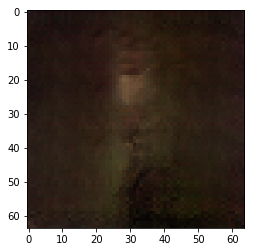

In [167]:
show_result(G2,z_dark)

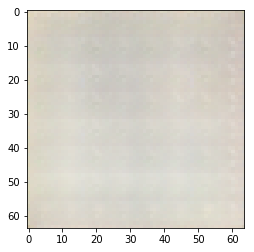

In [168]:
show_result(G2, z_light)

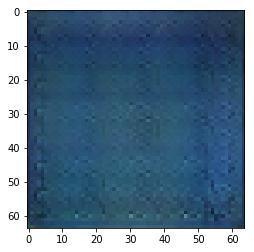

In [259]:
show_result(G2, z_blue)

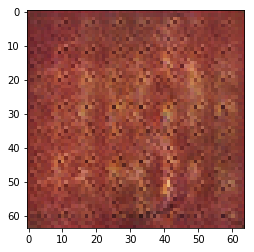

In [170]:
show_result(G2, z_red)

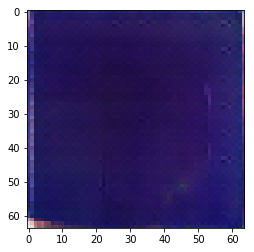

In [192]:
show_result(G2, z_red+z_blue)

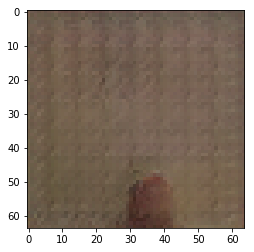

In [193]:
show_result(G2, z_light+z_dark)

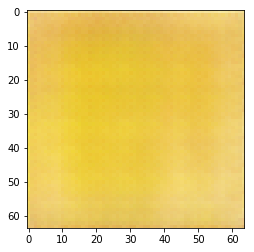

In [177]:
show_result(G2, z_red+z_light)

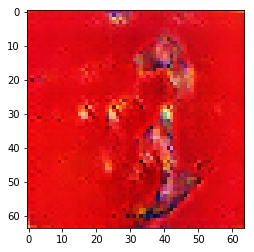

In [216]:
show_result(G2, z_red+z_red)

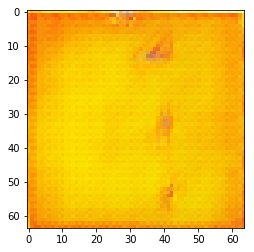

In [211]:
show_result(G2, z_red+z_light+z_red)

In [310]:
import pickle

In [313]:
d = {
    'red': z_red,
    'blue': z_blue,
    'dark': z_dark,
    'light': z_light,
    'yellow': z_yellow,
    'purple': z_purple
}
with open("color_vectors.p", 'wb') as f:
    pickle.dump(d,f)

In [318]:
with open("color_vectors.p", 'rb') as f:
    d = pickle.load(f)

In [319]:
d

{'blue': Variable containing:
 ( 0 , 0 ,.,.) = 
  -0.4726
 
 ( 0 , 1 ,.,.) = 
  -0.3735
 
 ( 0 , 2 ,.,.) = 
  -0.6448
 
 ( 0 , 3 ,.,.) = 
   0.4707
 
 ( 0 , 4 ,.,.) = 
  -0.1929
 
 ( 0 , 5 ,.,.) = 
   0.1799
 
 ( 0 , 6 ,.,.) = 
  -0.0683
 
 ( 0 , 7 ,.,.) = 
   0.4543
 
 ( 0 , 8 ,.,.) = 
  -0.2748
 
 ( 0 , 9 ,.,.) = 
  -0.2814
 
 ( 0 ,10 ,.,.) = 
  -0.4217
 
 ( 0 ,11 ,.,.) = 
  -0.3331
 
 ( 0 ,12 ,.,.) = 
  -0.3766
 
 ( 0 ,13 ,.,.) = 
   0.0385
 
 ( 0 ,14 ,.,.) = 
   0.7499
 
 ( 0 ,15 ,.,.) = 
   0.3963
 
 ( 0 ,16 ,.,.) = 
   0.3454
 
 ( 0 ,17 ,.,.) = 
  -0.4675
 
 ( 0 ,18 ,.,.) = 
   0.4768
 
 ( 0 ,19 ,.,.) = 
  -0.0872
 
 ( 0 ,20 ,.,.) = 
  -0.1019
 
 ( 0 ,21 ,.,.) = 
   0.1570
 
 ( 0 ,22 ,.,.) = 
   0.6041
 
 ( 0 ,23 ,.,.) = 
   0.2100
 
 ( 0 ,24 ,.,.) = 
   0.4904
 
 ( 0 ,25 ,.,.) = 
  -0.1112
 
 ( 0 ,26 ,.,.) = 
   0.0767
 
 ( 0 ,27 ,.,.) = 
   0.6133
 
 ( 0 ,28 ,.,.) = 
  -0.3001
 
 ( 0 ,29 ,.,.) = 
  -0.0539
 
 ( 0 ,30 ,.,.) = 
   0.7731
 
 ( 0 ,31 ,.,.) = 
   0.1798
 
 ( 0 ,32 ,

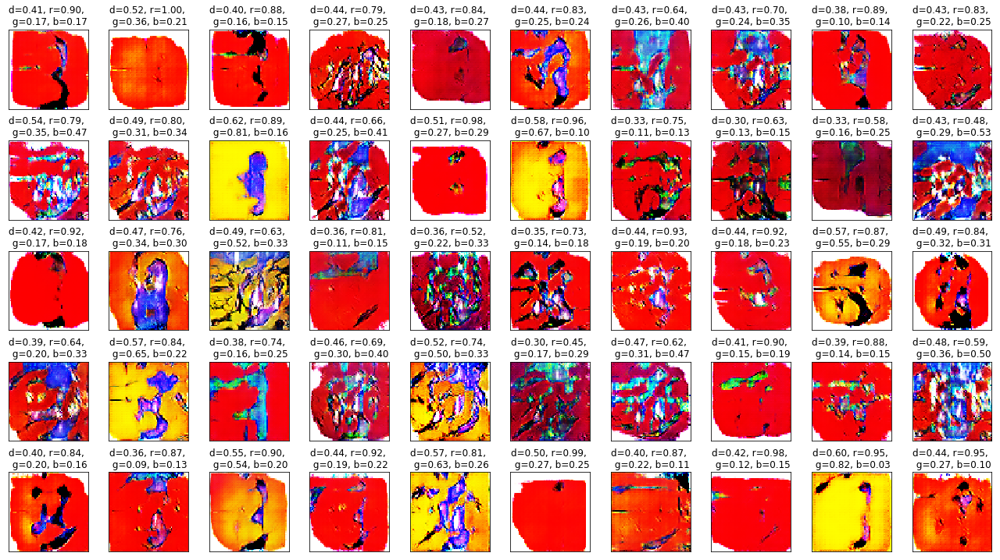

In [220]:
z = Variable(torch.FloatTensor(50, 100, 1, 1).normal_(), volatile=True)
show_result(G2, (z + z_red*3))

In [291]:
z_blue_np = z_blue.data.numpy().reshape(-1)
z_red_np = z_red.data.numpy().reshape(-1)
z_dark_np = z_dark.data.numpy().reshape(-1)
z_light_np = z_light.data.numpy().reshape(-1)

z_red_norm = z_red_np / (np.linalg.norm(z_red_np))
z_blue_norm = z_blue_np / (np.linalg.norm(z_blue_np))
z_dark_norm = z_dark_np / (np.linalg.norm(z_dark_np))
z_light_norm = z_light_np / (np.linalg.norm(z_light_np))

In [292]:
tensor_z_blue_norm = torch.from_numpy(z_blue_norm)
tensor_z_blue_nrom = Variable(tensor_z_blue_norm.view(1,-1,1,1), volatile=True)

tensor_z_red_norm = torch.from_numpy(z_red_norm)
tensor_z_red_nrom = Variable(tensor_z_red_norm.view(1,-1,1,1), volatile=True)

tensor_z_dark_norm = torch.from_numpy(z_dark_norm)
tensor_z_dark_nrom = Variable(tensor_z_dark_norm.view(1,-1,1,1), volatile=True)

tensor_z_light_norm = torch.from_numpy(z_light_norm)
tensor_z_light_nrom = Variable(tensor_z_light_norm.view(1,-1,1,1), volatile=True)

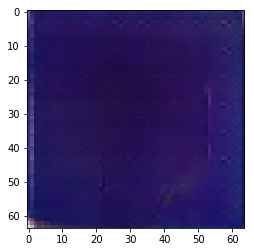

In [248]:
show_result(G2, z_blue+tensor_z_red_nrom)

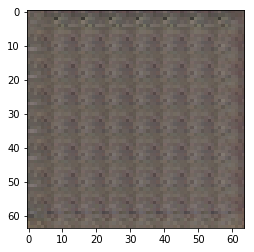

In [309]:
show_result(G2, tensor_z_light_nrom)

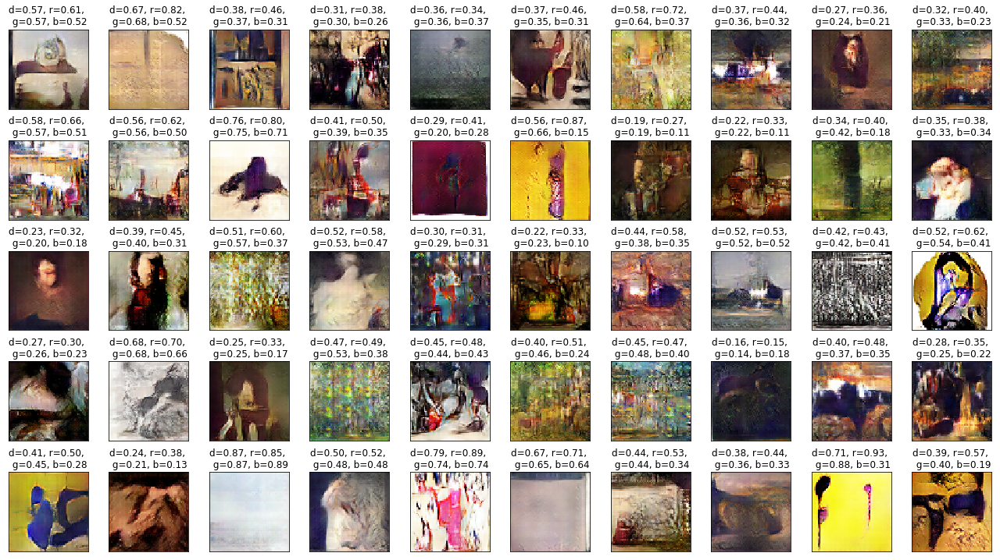

In [266]:
show_result(G2, z)

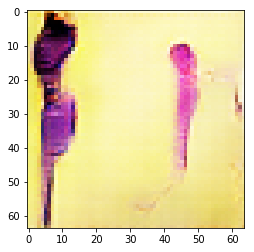

In [307]:
show_result(G2, z[48].view(1,-1,1,1)-tensor_z_red_nrom-tensor_z_light_nrom+tensor_z_blue_nrom)

In [273]:
lala = norm(100)

In [275]:
print(lala)

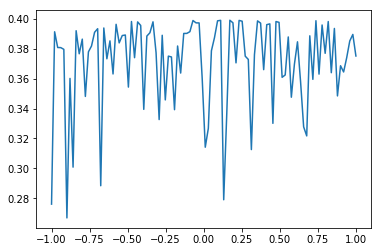

In [283]:
fig, ax = plt.subplots(1, 1)
x = np.linspace(-1,1, 100)
ax.plot(x, norm.pdf(z_red_np))

# Red heatmap

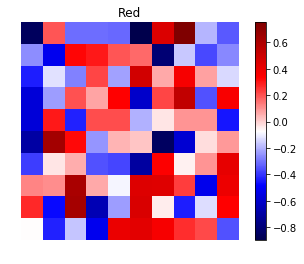

In [295]:
plt.imshow(z_red_np.reshape(10,10), cmap='seismic')
plt.axis('off')
plt.colorbar()
plt.title('Red')
plt.show()

# Blue heatmap

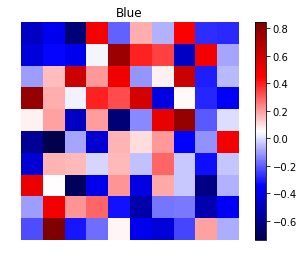

In [296]:
plt.imshow(z_blue_np.reshape(10,10), cmap='seismic')
plt.axis('off')
plt.colorbar()
plt.title('Blue')
plt.show()

# Dark heatmap

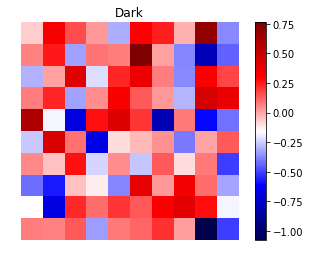

In [297]:
plt.imshow(z_dark_np.reshape(10,10), cmap='seismic')
plt.axis('off')
plt.colorbar()
plt.title('Dark')
plt.show()

# Light heatmap

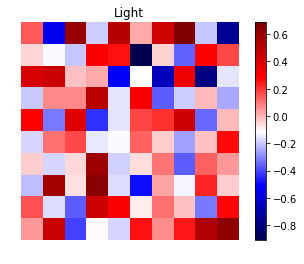

In [298]:
plt.imshow(z_light_np.reshape(10,10), cmap='seismic')
plt.axis('off')
plt.colorbar()
plt.title('Light')
plt.show()

# Yellow heatmap

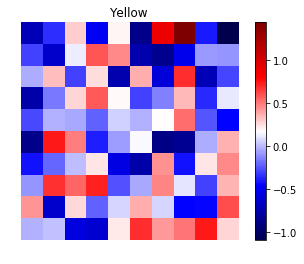

In [299]:
z_yellow_np = z_red_np+z_light_np
plt.imshow(z_yellow_np.reshape(10,10), cmap='seismic')
plt.axis('off')
plt.colorbar()
plt.title('Yellow')
plt.show()

# Purple heatmap

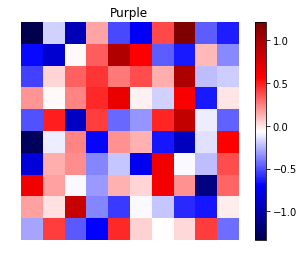

In [300]:
z_purple_np = z_red_np+z_blue_np
plt.imshow(z_purple_np.reshape(10,10), cmap='seismic')
plt.axis('off')
plt.colorbar()
plt.title('Purple')
plt.show()

# Brown heatmap

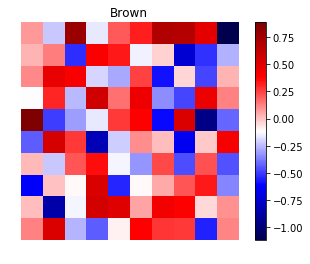

In [301]:
z_brown_np = z_dark_np+z_light_np
plt.imshow(z_brown_np.reshape(10,10), cmap='seismic')
plt.axis('off')
plt.colorbar()
plt.title('Brown')
plt.show()